In [1]:
import numpy as np
from PIL import Image
import os
from utils import opening_closing, closing_opening

# read lena.bmp
sample_img = Image.open('lena.bmp')
sample_arr = np.array(sample_img).astype(int)

# build output directory
if not os.path.exists('results'):
    os.mkdir('results')

In [2]:
# define function

def gaussian_noise_transform(img, amp):
    return img + amp * np.random.normal(0, 1, img.shape)


def salt_and_pepper_noise_transform(img, thr):
    prob_map = np.random.uniform(0, 1, img.shape)
    salt_idx = prob_map > 1 - thr
    pepper_idx = prob_map < thr
    img_sp = img.copy()
    img_sp[salt_idx] = 255
    img_sp[pepper_idx] = 0
    return img_sp


def padding(img, filter_size):
    img_pad = np.zeros(
        (img.shape[0] + filter_size // 2 * 2, img.shape[1] + filter_size // 2 * 2), np.int)
    for i in np.arange(filter_size // 2, img.shape[0] + filter_size // 2):
        for j in np.arange(filter_size // 2, img.shape[1] + filter_size // 2):
            img_pad[i, j] = img[i - filter_size // 2, j - filter_size // 2]
    return img_pad


def box_filter(img, filter_size):
    img_mean = np.zeros(img.shape)
    img_pad = padding(img, filter_size)
    for i in range(img_mean.shape[0]):
        for j in range(img_mean.shape[1]):
            img_mean[i, j] = img_pad[i: i +
                                     filter_size, j: j + filter_size].mean()
    return img_mean


def median_filter(img, filter_size):
    img_med = np.zeros(img.shape)
    img_pad = padding(img, filter_size)
    for i in range(img_med.shape[0]):
        for j in range(img_med.shape[1]):
            img_med[i, j] = np.median(
                img_pad[i: i + filter_size, j: j + filter_size])
    return img_med


def snr(img_org, img_pro):
    noise = img_pro - img_org
    return np.log10(img_org.var()/noise.var()) * 10

In [3]:
# (a) Generate noisy images with gaussian noise(amplitude of 10 and 30)

gn_10 = gaussian_noise_transform(sample_arr, 10)
PIL_image = Image.fromarray(gn_10.astype('uint8'))
PIL_image.save(
    'results/GaussianNoise_amp10_snr{:.4f}.bmp'.format(snr(sample_arr, gn_10)))

gn_30 = gaussian_noise_transform(sample_arr, 30)
PIL_image = Image.fromarray(gn_30.astype('uint8'))
PIL_image.save(
    'results/GaussianNoise_amp30_snr{:.4f}.bmp'.format(snr(sample_arr, gn_30)))

In [4]:
# (b) Generate noisy images with salt-and-pepper noise( probability 0.1 and 0.05)

sp_01 = salt_and_pepper_noise_transform(sample_arr, 0.1)
PIL_image = Image.fromarray(sp_01.astype('uint8'))
PIL_image.save(
    'results/SaltAndPepperNoise_thr01_snr{:.4f}.bmp'.format(snr(sample_arr, sp_01)))

sp_005 = salt_and_pepper_noise_transform(sample_arr, 0.05)
PIL_image = Image.fromarray(sp_005.astype('uint8'))
PIL_image.save(
    'results/SaltAndPepperNoise_thr005_snr{:.4f}.bmp'.format(snr(sample_arr, sp_005)))

In [5]:
# (c) Use the 3x3, 5x5 box filter on images generated by (a)(b)

bf_gn10_k3 = box_filter(gn_10, 3)
PIL_image = Image.fromarray(bf_gn10_k3.astype('uint8'))
PIL_image.save(
    'results/BoxFilter_s3_GaussianNoise_amp10_snr{:.4f}.bmp'.format(snr(sample_arr, bf_gn10_k3)))

bf_gn30_k3 = box_filter(gn_30, 3)
PIL_image = Image.fromarray(bf_gn30_k3.astype('uint8'))
PIL_image.save(
    'results/BoxFilter_s3_GaussianNoise_amp30_snr{:.4f}.bmp'.format(snr(sample_arr, bf_gn30_k3)))

bf_sp01_k3 = box_filter(sp_01, 3)
PIL_image = Image.fromarray(bf_sp01_k3.astype('uint8'))
PIL_image.save(
    'results/BoxFilter_s3_SaltAndPepperNoise_thr01_snr{:.4f}.bmp'.format(snr(sample_arr, bf_sp01_k3)))

bf_sp005_k3 = box_filter(sp_005, 3)
PIL_image = Image.fromarray(bf_sp005_k3.astype('uint8'))
PIL_image.save(
    'results/BoxFilter_s3_SaltAndPepperNoise_thr005_snr{:.4f}.bmp'.format(snr(sample_arr, bf_sp005_k3)))

bf_gn10_k5 = box_filter(gn_10, 5)
PIL_image = Image.fromarray(bf_gn10_k5.astype('uint8'))
PIL_image.save(
    'results/BoxFilter_s5_GaussianNoise_amp10_snr{:.4f}.bmp'.format(snr(sample_arr, bf_gn10_k5)))

bf_gn30_k5 = box_filter(gn_30, 5)
PIL_image = Image.fromarray(bf_gn30_k5.astype('uint8'))
PIL_image.save(
    'results/BoxFilter_s5_GaussianNoise_amp30_snr{:.4f}.bmp'.format(snr(sample_arr, bf_gn30_k5)))

bf_sp01_k5 = box_filter(sp_01, 5)
PIL_image = Image.fromarray(bf_sp01_k5.astype('uint8'))
PIL_image.save(
    'results/BoxFilter_s5_SaltAndPepperNoise_thr01_snr{:.4f}.bmp'.format(snr(sample_arr, bf_sp01_k5)))

bf_sp005_k5 = box_filter(sp_005, 5)
PIL_image = Image.fromarray(bf_sp005_k5.astype('uint8'))
PIL_image.save(
    'results/BoxFilter_s5_SaltAndPepperNoise_thr005_snr{:.4f}.bmp'.format(snr(sample_arr, bf_sp005_k5)))


In [6]:
# (d) Use 3x3, 5x5 median filter on images generated by (a)(b)

mf_gn10_k3 = median_filter(gn_10, 3)
PIL_image = Image.fromarray(mf_gn10_k3.astype('uint8'))
PIL_image.save(
    'results/MedianFilter_s3_GaussianNoise_amp10_snr{:.4f}.bmp'.format(snr(sample_arr, mf_gn10_k3)))

mf_gn30_k3 = median_filter(gn_30, 3)
PIL_image = Image.fromarray(mf_gn30_k3.astype('uint8'))
PIL_image.save(
    'results/MedianFilter_s3_GaussianNoise_amp30_snr{:.4f}.bmp'.format(snr(sample_arr, mf_gn30_k3)))

mf_sp01_k3 = median_filter(sp_01, 3)
PIL_image = Image.fromarray(mf_sp01_k3.astype('uint8'))
PIL_image.save(
    'results/MedianFilter_s3_SaltAndPepperNoise_thr01_snr{:.4f}.bmp'.format(snr(sample_arr, mf_sp01_k3)))

mf_sp005_k3 = median_filter(sp_005, 3)
PIL_image = Image.fromarray(mf_sp005_k3.astype('uint8'))
PIL_image.save(
    'results/MedianFilter_s3_SaltAndPepperNoise_thr005_snr{:.4f}.bmp'.format(snr(sample_arr, mf_sp005_k3)))

mf_gn10_k5 = median_filter(gn_10, 5)
PIL_image = Image.fromarray(mf_gn10_k5.astype('uint8'))
PIL_image.save(
    'results/MedianFilter_s5_GaussianNoise_amp10_snr{:.4f}.bmp'.format(snr(sample_arr, mf_gn10_k5)))

mf_gn30_k5 = median_filter(gn_30, 5)
PIL_image = Image.fromarray(mf_gn30_k5.astype('uint8'))
PIL_image.save(
    'results/MedianFilter_s5_GaussianNoise_amp30_snr{:.4f}.bmp'.format(snr(sample_arr, mf_gn30_k5)))

mf_sp01_k5 = median_filter(sp_01, 5)
PIL_image = Image.fromarray(mf_sp01_k5.astype('uint8'))
PIL_image.save(
    'results/MedianFilter_s5_SaltAndPepperNoise_thr01_snr{:.4f}.bmp'.format(snr(sample_arr, mf_sp01_k5)))

mf_sp005_k5 = median_filter(sp_005, 5)
PIL_image = Image.fromarray(mf_sp005_k5.astype('uint8'))
PIL_image.save(
    'results/MedianFilter_s5_SaltAndPepperNoise_thr005_snr{:.4f}.bmp'.format(snr(sample_arr, mf_sp005_k5)))

In [7]:
# (e) Use both opening-then-closing and closing-then opening filter (using the octogonal 3-5-5-5-3 kernel, value = 0) on images generated by (a)(b)

kernel = [
    [-2, -1], [-2, 0], [-2, 1],
    [-1, -2], [-1, -1], [-1, 0], [-1, 1], [-1, 2],
    [0, -2], [0, -1], [0, 0], [0, 1], [0, 2],
    [1, -2], [1, -1], [1, 0], [1, 1], [1, 2],
    [2, -1], [2, 0], [2, 1]
]

gn10_oc = opening_closing(gn_10, kernel)
PIL_image = Image.fromarray(gn10_oc.astype('uint8'))
PIL_image.save(
    'results/OpeningClosing_GaussianNoise_amp10_snr{:.4f}.bmp'.format(snr(sample_arr, gn10_oc)))

gn30_oc = opening_closing(gn_30, kernel)
PIL_image = Image.fromarray(gn30_oc.astype('uint8'))
PIL_image.save(
    'results/OpeningClosing_GaussianNoise_amp30_snr{:.4f}.bmp'.format(snr(sample_arr, gn30_oc)))

sp01_oc = opening_closing(sp_01, kernel)
PIL_image = Image.fromarray(sp01_oc.astype('uint8'))
PIL_image.save(
    'results/OpeningClosing_SaltAndPepperNoise_thr01_snr{:.4f}.bmp'.format(snr(sample_arr, sp01_oc)))

sp005_oc = opening_closing(sp_005, kernel)
PIL_image = Image.fromarray(sp005_oc.astype('uint8'))
PIL_image.save(
    'results/OpeningClosing_SaltAndPepperNoise_thr005_snr{:.4f}.bmp'.format(snr(sample_arr, sp005_oc)))

gn10_co = closing_opening(gn_10, kernel)
PIL_image = Image.fromarray(gn10_co.astype('uint8'))
PIL_image.save(
    'results/ClosingOpening_GaussianNoise_amp10_snr{:.4f}.bmp'.format(snr(sample_arr, gn10_co)))

gn30_co = closing_opening(gn_30, kernel)
PIL_image = Image.fromarray(gn30_co.astype('uint8'))
PIL_image.save(
    'results/ClosingOpening_GaussianNoise_amp30_snr{:.4f}.bmp'.format(snr(sample_arr, gn30_co)))

sp01_co = closing_opening(sp_01, kernel)
PIL_image = Image.fromarray(sp01_co.astype('uint8'))
PIL_image.save(
    'results/ClosingOpening_SaltAndPepperNoise_thr01_snr{:.4f}.bmp'.format(snr(sample_arr, sp01_co)))

sp005_co = closing_opening(sp_005, kernel)
PIL_image = Image.fromarray(sp005_co.astype('uint8'))
PIL_image.save(
    'results/ClosingOpening_SaltAndPepperNoise_thr005_snr{:.4f}.bmp'.format(snr(sample_arr, sp005_co)))

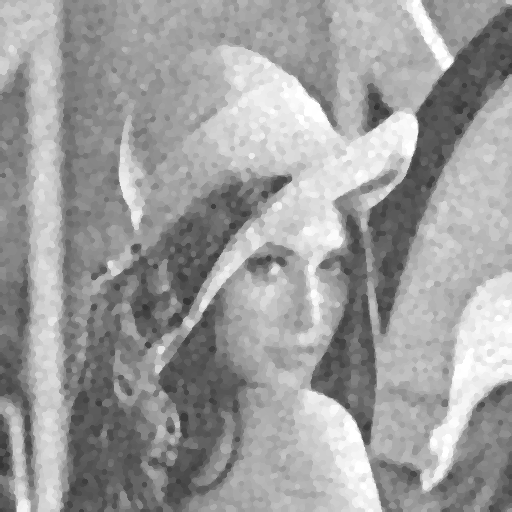

In [15]:
Image.fromarray(gn30_co.astype('uint8'))

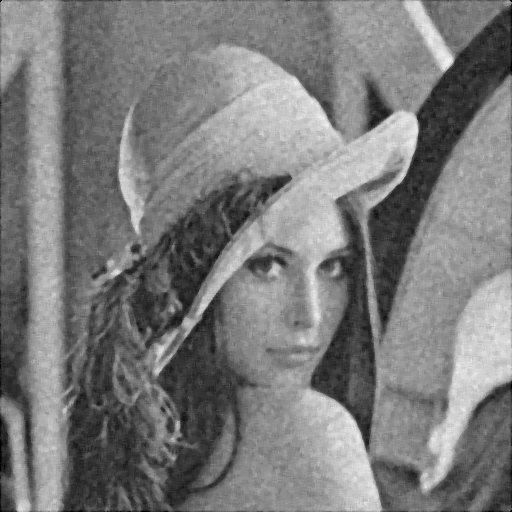

In [16]:
Image.fromarray(mf_gn30_k5.astype('uint8'))

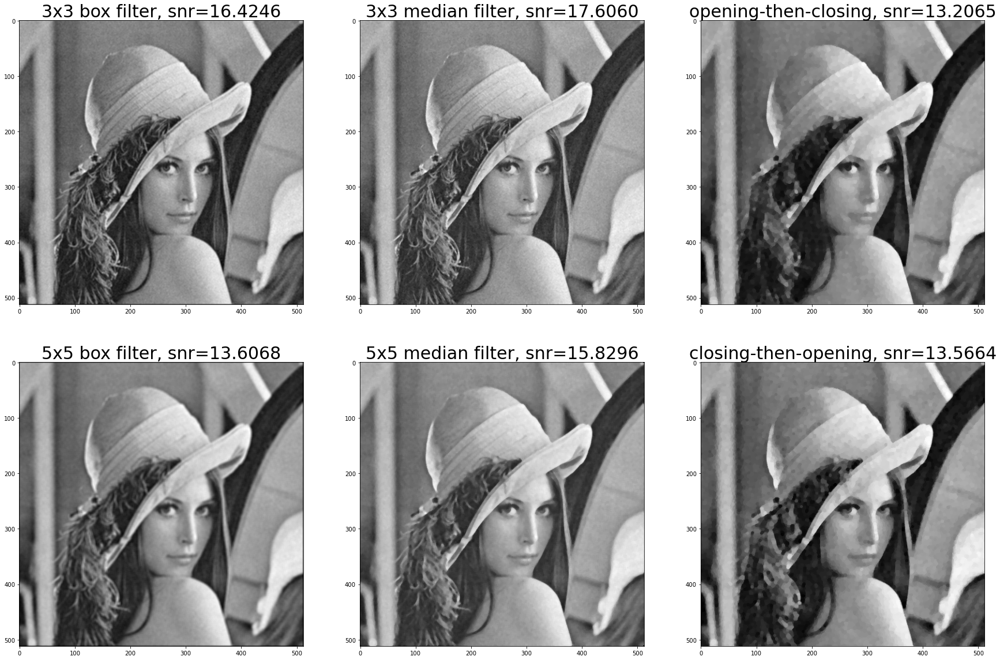

In [19]:
import numpy as np
import matplotlib.pyplot as plt

fig, ax = plt.subplots(2, 3, figsize=(30, 20))

# ax[0, 0].imshow(gn_10, cmap = 'gray')
# ax[0, 0].set_title('gaussian noise, amp=10, snr={:.4f}'.format(snr(sample_arr, gn_10)))

ax[0, 0].imshow(bf_gn10_k3, cmap = 'gray')
ax[0, 0].set_title('3x3 box filter, snr={:.4f}'.format(snr(sample_arr, bf_gn10_k3)), fontsize=30)

ax[1, 0].imshow(bf_gn10_k5, cmap = 'gray')
ax[1, 0].set_title('5x5 box filter, snr={:.4f}'.format(snr(sample_arr, bf_gn10_k5)), fontsize=30)

ax[0, 1].imshow(mf_gn10_k3, cmap = 'gray')
ax[0, 1].set_title('3x3 median filter, snr={:.4f}'.format(snr(sample_arr, mf_gn10_k3)), fontsize=30)
           
ax[1, 1].imshow(mf_gn10_k5, cmap = 'gray')
ax[1, 1].set_title('5x5 median filter, snr={:.4f}'.format(snr(sample_arr, mf_gn10_k5)), fontsize=30)

ax[0, 2].imshow(gn10_oc, cmap = 'gray')
ax[0, 2].set_title('opening-then-closing, snr={:.4f}'.format(snr(sample_arr, gn10_oc)), fontsize=30)
               
ax[1, 2].imshow(gn10_co, cmap = 'gray')
ax[1, 2].set_title('closing-then-opening, snr={:.4f}'.format(snr(sample_arr, gn10_co)), fontsize=30)

plt.show()

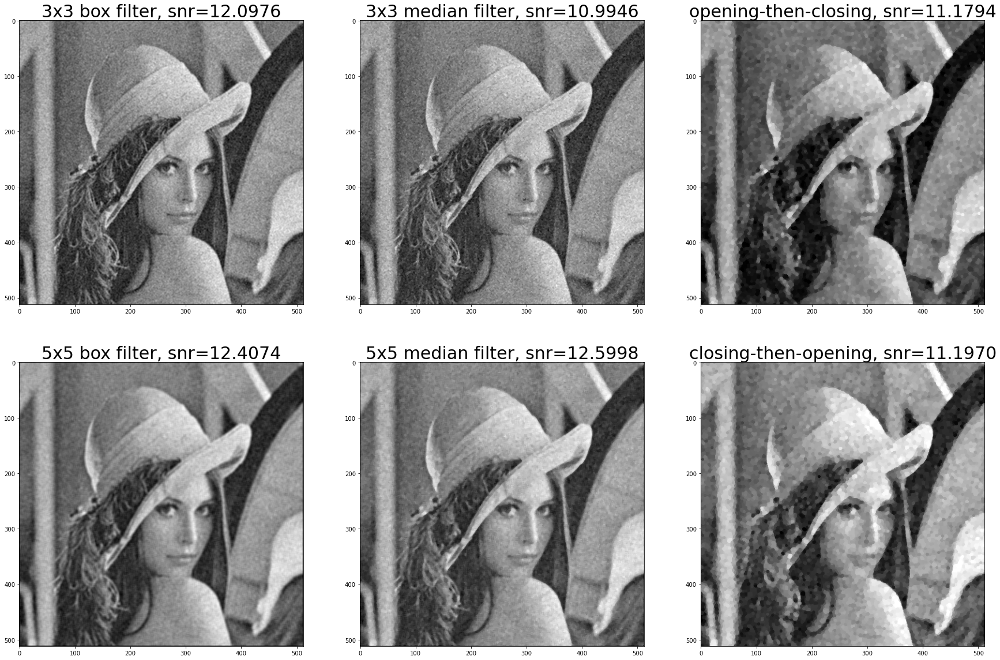

In [20]:
import numpy as np
import matplotlib.pyplot as plt
fig, ax = plt.subplots(2, 3, figsize=(30, 20))

# ax[0, 0].imshow(gn_10, cmap = 'gray')
# ax[0, 0].set_title('gaussian noise, amp=10, snr={:.4f}'.format(snr(sample_arr, gn_10)))

ax[0, 0].imshow(bf_gn30_k3, cmap = 'gray')
ax[0, 0].set_title('3x3 box filter, snr={:.4f}'.format(snr(sample_arr, bf_gn30_k3)), fontsize=30)

ax[1, 0].imshow(bf_gn30_k5, cmap = 'gray')
ax[1, 0].set_title('5x5 box filter, snr={:.4f}'.format(snr(sample_arr, bf_gn30_k5)), fontsize=30)

ax[0, 1].imshow(mf_gn30_k3, cmap = 'gray')
ax[0, 1].set_title('3x3 median filter, snr={:.4f}'.format(snr(sample_arr, mf_gn30_k3)), fontsize=30)
           
ax[1, 1].imshow(mf_gn30_k5, cmap = 'gray')
ax[1, 1].set_title('5x5 median filter, snr={:.4f}'.format(snr(sample_arr, mf_gn30_k5)), fontsize=30)

ax[0, 2].imshow(gn30_oc, cmap = 'gray')
ax[0, 2].set_title('opening-then-closing, snr={:.4f}'.format(snr(sample_arr, gn30_oc)), fontsize=30)
               
ax[1, 2].imshow(gn30_co.astype('uint8'), cmap = 'gray')
ax[1, 2].set_title('closing-then-opening, snr={:.4f}'.format(snr(sample_arr, gn30_co)), fontsize=30)

plt.show()

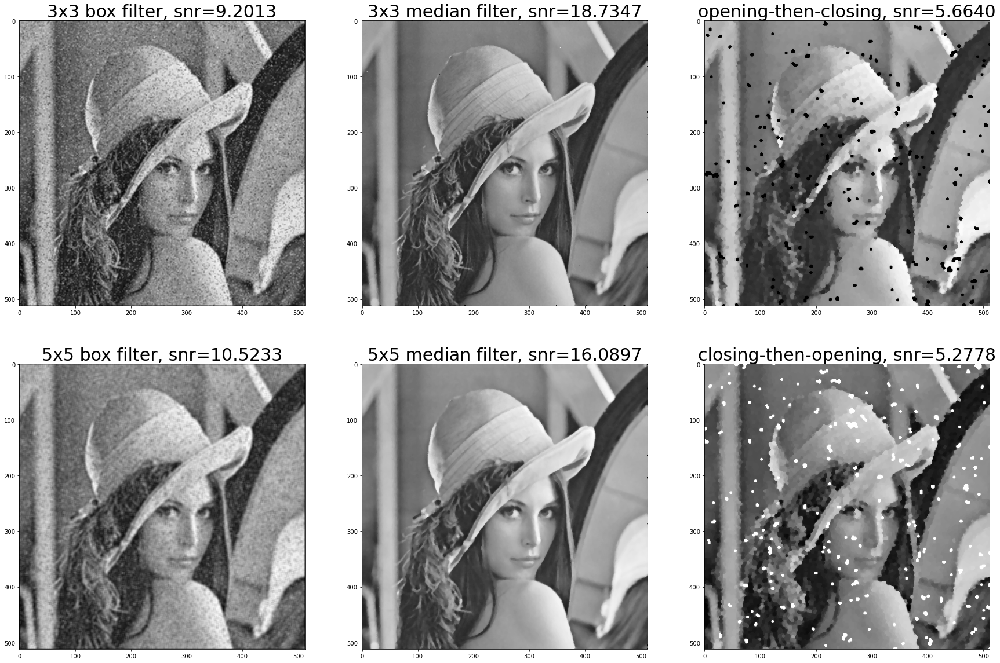

In [10]:
import numpy as np
import matplotlib.pyplot as plt
fig, ax = plt.subplots(2, 3, figsize=(30, 20))

# ax[0, 0].imshow(gn_10, cmap = 'gray')
# ax[0, 0].set_title('gaussian noise, amp=10, snr={:.4f}'.format(snr(sample_arr, gn_10)))

ax[0, 0].imshow(bf_sp005_k3, cmap = 'gray')
ax[0, 0].set_title('3x3 box filter, snr={:.4f}'.format(snr(sample_arr, bf_sp005_k3)), fontsize=30)

ax[1, 0].imshow(bf_sp005_k5, cmap = 'gray')
ax[1, 0].set_title('5x5 box filter, snr={:.4f}'.format(snr(sample_arr, bf_sp005_k5)), fontsize=30)

ax[0, 1].imshow(mf_sp005_k3, cmap = 'gray')
ax[0, 1].set_title('3x3 median filter, snr={:.4f}'.format(snr(sample_arr, mf_sp005_k3)), fontsize=30)
           
ax[1, 1].imshow(mf_sp005_k5, cmap = 'gray')
ax[1, 1].set_title('5x5 median filter, snr={:.4f}'.format(snr(sample_arr, mf_sp005_k5)), fontsize=30)

ax[0, 2].imshow(sp005_oc, cmap = 'gray')
ax[0, 2].set_title('opening-then-closing, snr={:.4f}'.format(snr(sample_arr, sp005_oc)), fontsize=30)
               
ax[1, 2].imshow(sp005_co, cmap = 'gray')
ax[1, 2].set_title('closing-then-opening, snr={:.4f}'.format(snr(sample_arr, sp005_co)), fontsize=30)

plt.show()

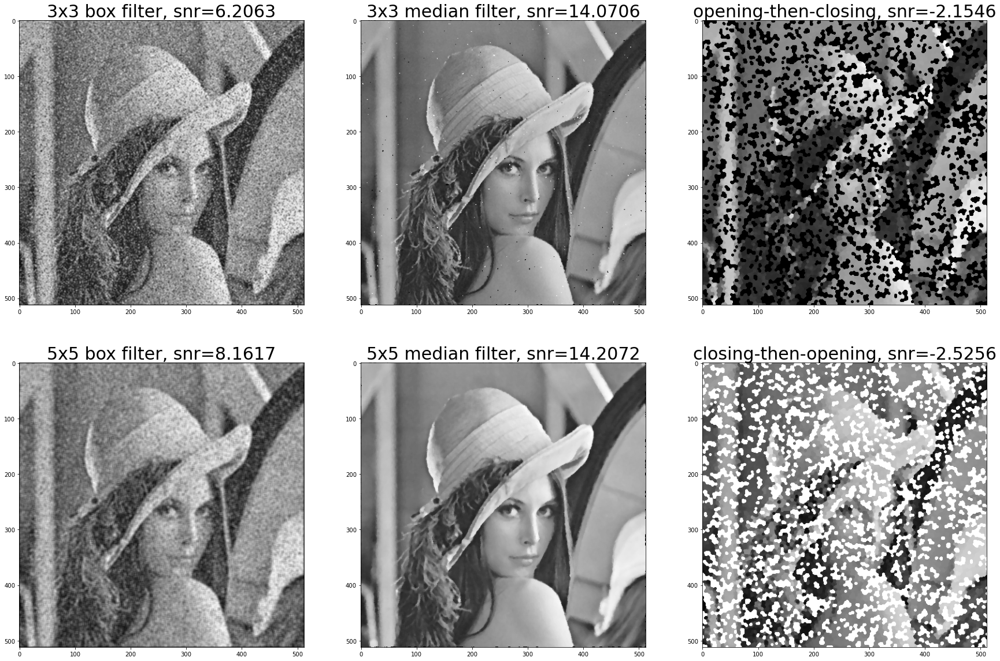

In [11]:
import numpy as np
import matplotlib.pyplot as plt
fig, ax = plt.subplots(2, 3, figsize=(30, 20))

# ax[0, 0].imshow(gn_10, cmap = 'gray')
# ax[0, 0].set_title('gaussian noise, amp=10, snr={:.4f}'.format(snr(sample_arr, gn_10)))

ax[0, 0].imshow(bf_sp01_k3, cmap = 'gray')
ax[0, 0].set_title('3x3 box filter, snr={:.4f}'.format(snr(sample_arr, bf_sp01_k3)), fontsize=30)

ax[1, 0].imshow(bf_sp01_k5, cmap = 'gray')
ax[1, 0].set_title('5x5 box filter, snr={:.4f}'.format(snr(sample_arr, bf_sp01_k5)), fontsize=30)

ax[0, 1].imshow(mf_sp01_k3, cmap = 'gray')
ax[0, 1].set_title('3x3 median filter, snr={:.4f}'.format(snr(sample_arr, mf_sp01_k3)), fontsize=30)
           
ax[1, 1].imshow(mf_sp01_k5, cmap = 'gray')
ax[1, 1].set_title('5x5 median filter, snr={:.4f}'.format(snr(sample_arr, mf_sp01_k5)), fontsize=30)

ax[0, 2].imshow(sp01_oc, cmap = 'gray')
ax[0, 2].set_title('opening-then-closing, snr={:.4f}'.format(snr(sample_arr, sp01_oc)), fontsize=30)
               
ax[1, 2].imshow(sp01_co, cmap = 'gray')
ax[1, 2].set_title('closing-then-opening, snr={:.4f}'.format(snr(sample_arr, sp01_co)), fontsize=30)

plt.show()

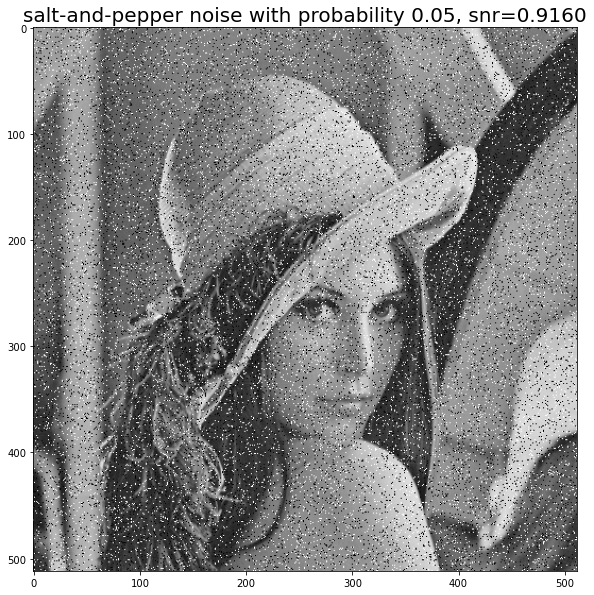

In [12]:
plt.figure(figsize=(20,10))
plt.imshow(sp_005, cmap = 'gray')
plt.title('salt-and-pepper noise with probability 0.05, snr={:.4f}'.format(snr(sample_arr, sp_005)), fontsize=20)
plt.show()

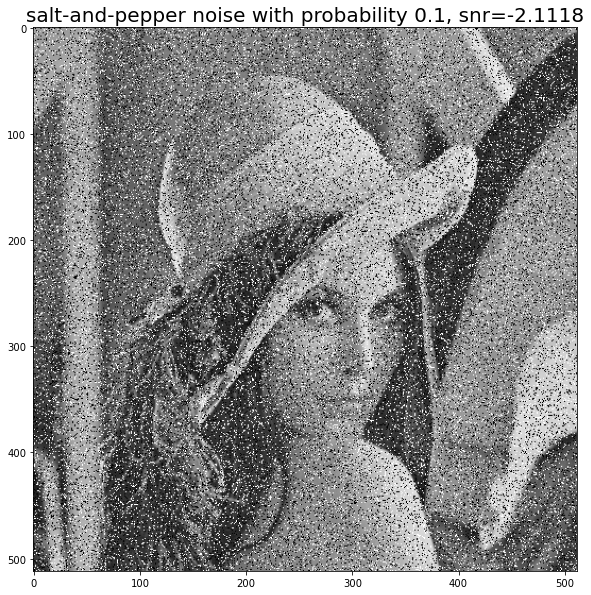

In [21]:
plt.figure(figsize=(20,10))
plt.imshow(sp_01, cmap = 'gray')
plt.title('salt-and-pepper noise with probability 0.1, snr={:.4f}'.format(snr(sample_arr, sp_01)), fontsize=20)
plt.show()

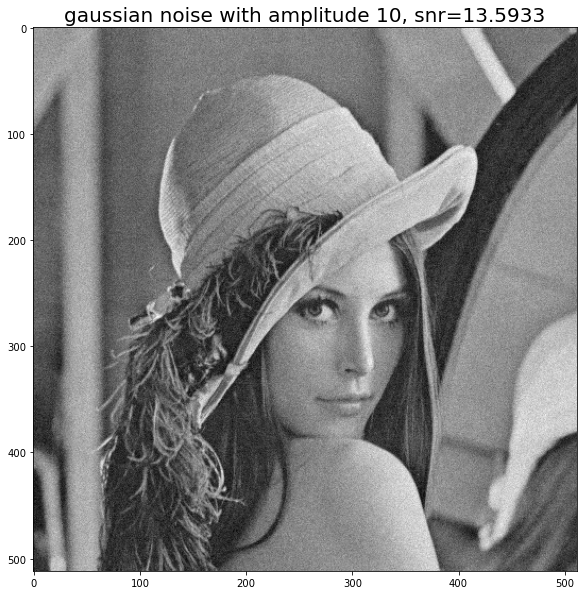

In [13]:
plt.figure(figsize=(20,10))
plt.imshow(gn_10, cmap = 'gray')
plt.title('gaussian noise with amplitude 10, snr={:.4f}'.format(snr(sample_arr, gn_10)), fontsize=20)
plt.show()

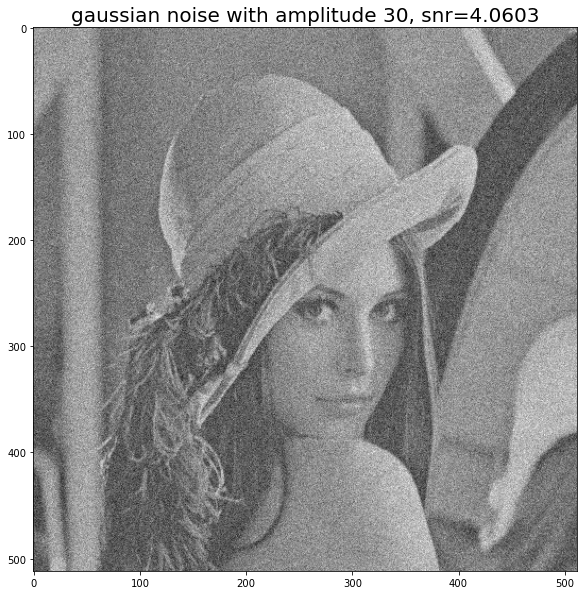

In [14]:
plt.figure(figsize=(20,10))
plt.imshow(gn_30, cmap = 'gray')
plt.title('gaussian noise with amplitude 30, snr={:.4f}'.format(snr(sample_arr, gn_30)), fontsize=20)
plt.show()